# 6. 🧠 MISAW CNN classification

![Status](https://img.shields.io/static/v1.svg?label=Status&message=Finished&color=green)

**Filled notebook:**
[![View filled on Github](https://img.shields.io/static/v1.svg?logo=github&label=Repo&message=View%20On%20Github&color=lightgrey)](https://github.com/bfortuno/Surgical-Phase-Recognition/blob/main/docs/tutorial_notebooks/tutorial6/misaw_cnn.ipynb)
[![Open filled In Collab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/bfortuno/Surgical-Phase-Recognition/blob/main/docs/tutorial_notebooks/tutorial6/misaw_cnn.ipynb)    
**Author:** Benjamin I. Fortuno

This notebook is intended to use CNN to classify phases, steps, etc in data from the MISAW dataset, commonly used for computer vision and machine learning tasks. It covers:

- Creating pytorch Dataset
- Exploring options of CNN
- Visualize training and validation results

### 🧰 Importing Required Libraries
This section loads essential Python libraries like `os`, `cv2`, `glob`, and `pandas` which are needed for handling files, images, and data manipulation.

In [1]:
# 📦 Install dependencies
!pip install pytorch-lightning -q
!pip install torchmetrics -q
!pip install pytorch-tcn -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.1/823.1 kB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 120.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 94.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 55.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 79.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 961.5/961.5 kB 52.3 MB/s eta 0:00:00


In [2]:
# Standard library
import os           # For file and directory operations
import glob         # For finding files using wildcard patterns
import json         # For saving annotations in JSON format
import shutil       # For copying images

# Third-party libraries
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# PyTorch
import torch
from torch import nn
from torch.utils.data import DataLoader, random_split

# Torchvision
from torchvision import datasets, transforms

# PyTorch Lightning
import pytorch_lightning as pl
from pytorch_lightning import LightningModule, Trainer
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint
from pytorch_lightning.loggers import TensorBoardLogger

# Torchmetrics
import torchmetrics

### 📥 Downloading the Dataset
Here we download the MISAW dataset in `.zip` format from a Dropbox link. This dataset contains videos and annotations for surgical workflow analysis.

In [3]:
!wget -O MISAW.zip https://www.dropbox.com/scl/fi/psmlokrc5ms958ggqyv3u/MISAW.zip?rlkey=v91dz437npon5zz10olrbcqcd&st=54qvf31m&dl=0

--2025-05-12 09:54:27--  https://www.dropbox.com/scl/fi/psmlokrc5ms958ggqyv3u/MISAW.zip?rlkey=v91dz437npon5zz10olrbcqcd
Resolving www.dropbox.com (www.dropbox.com)... 162.125.66.18, 2620:100:6017:18::a27d:212
Connecting to www.dropbox.com (www.dropbox.com)|162.125.66.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://uc3388052cbe262938d2b68a5630.dl.dropboxusercontent.com/cd/0/inline/Cpg-3nn6ZWcvMHf9T4aqEYG2gjKe6Gs2q40aEzh35-U1Tdw9TrZi-APGrlm5R6a1JeHDCCo29lg7c6Aqw4qKECp4iuabaYYx5SnDxxJG1N-L8O88w1ilLhth-bazr1xyDKxTkF83esAeCcuWyJ2pIXHC/file# [following]
--2025-05-12 09:54:28--  https://uc3388052cbe262938d2b68a5630.dl.dropboxusercontent.com/cd/0/inline/Cpg-3nn6ZWcvMHf9T4aqEYG2gjKe6Gs2q40aEzh35-U1Tdw9TrZi-APGrlm5R6a1JeHDCCo29lg7c6Aqw4qKECp4iuabaYYx5SnDxxJG1N-L8O88w1ilLhth-bazr1xyDKxTkF83esAeCcuWyJ2pIXHC/file
Resolving uc3388052cbe262938d2b68a5630.dl.dropboxusercontent.com (uc3388052cbe262938d2b68a5630.dl.dropboxusercontent.com)... 162.125.2.15, 2620:10

### 📦 Extracting the Dataset
This cell unzips the downloaded file to access the raw data.

In [4]:
!unzip -qq MISAW.zip

## 🎞️ Frame Extraction from Videos
This section reads the videos and extracts every N-th frame (controlled by `resample_rate`).
Each video gets its own subdirectory of frames, organized as:
```
MISAW/
  └── train/
        └── Frames/
              └── <video_id>/frame_0000.jpg
```
These images will be later paired with annotations.

In [5]:
!sudo apt update
!sudo apt install -y ffmpeg


Hit:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:2 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:3 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:4 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Get:5 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,632 B]
Get:6 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Get:7 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [127 kB]
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:9 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Get:10 https://r2u.stat.illinois.edu/ubuntu jammy/main all Packages [8,927 kB]
Get:11 http://archive.ubuntu.com/ubuntu jammy-updates/universe amd64 Packages [1,546 kB]
Hit:12 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:13 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 Packages 

In [6]:
!nvidia-smi
!ffmpeg -encoders | grep nvenc


Mon May 12 09:54:59 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   45C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [7]:
import os

video_folder = 'MISAW/train/Video'
frames_folder = 'MISAW/train/Frames'
os.makedirs(frames_folder, exist_ok=True)

resample_rate = 6  # Adjust as needed

for video_file in os.listdir(video_folder):
    if video_file.endswith(('.mp4', '.avi', '.mov')):
        video_path = os.path.join(video_folder, video_file)
        video_name = os.path.splitext(video_file)[0]
        output_folder = os.path.join(frames_folder, video_name)
        os.makedirs(output_folder, exist_ok=True)

        # Use ffmpeg with GPU support to extract frames
        output_pattern = os.path.join(output_folder, "frame_%04d.jpg")
        command = f"ffmpeg -hwaccel cuda -i '{video_path}' -vf 'select=not(mod(n\\,{resample_rate}))' -vsync vfr '{output_pattern}'"

        print(f"Extracting frames from {video_file}...")
        os.system(command)
        print(f"Frames saved to {output_folder}")

print("Done!")


Extracting frames from 2_3.mp4...
Frames saved to MISAW/train/Frames/2_3
Extracting frames from 6_4.mp4...
Frames saved to MISAW/train/Frames/6_4
Extracting frames from 2_2.mp4...
Frames saved to MISAW/train/Frames/2_2
Extracting frames from 6_1.mp4...
Frames saved to MISAW/train/Frames/6_1
Extracting frames from 2_6.mp4...
Frames saved to MISAW/train/Frames/2_6
Extracting frames from 2_5.mp4...
Frames saved to MISAW/train/Frames/2_5
Extracting frames from 2_1.mp4...
Frames saved to MISAW/train/Frames/2_1
Extracting frames from 3_3.mp4...
Frames saved to MISAW/train/Frames/3_3
Extracting frames from 1_2.mp4...
Frames saved to MISAW/train/Frames/1_2
Extracting frames from 6_2.mp4...
Frames saved to MISAW/train/Frames/6_2
Extracting frames from 6_3.mp4...
Frames saved to MISAW/train/Frames/6_3
Extracting frames from 2_4.mp4...
Frames saved to MISAW/train/Frames/2_4
Extracting frames from 1_1.mp4...
Frames saved to MISAW/train/Frames/1_1
Extracting frames from 1_3.mp4...
Frames saved to M

## 🧾 Parsing Annotations and Building Frame-Label Pairs
Here we parse the `.txt` annotation files (one per video) to extract surgical phases, then pair each extracted frame with a corresponding label.
We also map textual phase labels to numeric IDs, which is important for training machine learning models.

In [8]:
# Folder where the annotation .txt files are stored (one per video)
annotation_folder = 'MISAW/train/Procedural decription'

# Folder where extracted frames from videos are stored (in subfolders per video)
frames_folder = 'MISAW/train/Frames'

# This is the same rate you used to extract frames from videos (e.g., every 120th frame)
# It must match or your labels won't align with the frames!

# --- Collect all unique phases first ---

# We'll store all unique phase labels (like "Idle", "Suturing", etc.) in this set
all_phases = set()

# Find all annotation files in the folder (e.g., 1_1_annotation.txt, 1_2_annotation.txt, etc.)
annotation_files = sorted(glob.glob(os.path.join(annotation_folder, '*_annotation.txt')))

# Loop through each annotation file and collect unique phase names
for anno_file in annotation_files:
    df = pd.read_csv(anno_file, sep='\t')  # Load the .txt file into a DataFrame
    all_phases.update(df['Step'].unique())  # Add unique phases to the set

# Create a dictionary to map each phase string to a unique integer ID
# Useful for training machine learning models
phase_to_id = {name: i for i, name in enumerate(sorted(all_phases))}

# Create the inverse mapping (ID to phase name) for visualization later
id_to_phase = {i: name for name, i in phase_to_id.items()}


# --- Build (frame_path, label) pairs ---

# This list will hold tuples like: ("path/to/frame.jpg", 2) → (frame, label_id)
all_data = []

# Go through each annotation file (one per video)
for anno_file in annotation_files:
    # Extract the video ID from the filename (e.g., "1_1_annotation.txt" → "1_1")
    video_id = os.path.basename(anno_file).replace('_annotation.txt', '')

    # Construct the path to the corresponding frame folder
    frame_dir = os.path.join(frames_folder, video_id)

    # Read the annotation file into a DataFrame
    df = pd.read_csv(anno_file, sep='\t')

    # Get the full list of phases (one per original video frame)
    phases = df['Step'].tolist()

    # Resample: only keep every N-th label (e.g., every 120th label)
    sampled_phases = phases[::resample_rate]

    # Convert phase strings to numeric labels using our earlier mapping
    sampled_ids = [phase_to_id[p] for p in sampled_phases]

    # Get the list of frame image paths, sorted so they match the order of labels
    frame_paths = sorted(glob.glob(os.path.join(frame_dir, '*.jpg')))

    # Sanity check: if the number of frames doesn’t match the number of labels, skip this video
    if len(frame_paths) != len(sampled_ids):
        print(f"⚠️ Mismatch for {video_id}: {len(frame_paths)} frames vs {len(sampled_ids)} labels")
        continue

    # Add all (frame_path, label_id) pairs to our global list
    all_data.extend(zip(frame_paths, sampled_ids))


# Final print to confirm total number of samples loaded
print(f"✅ Total samples: {len(all_data)}")


✅ Total samples: 21391


### Visualize images and phases

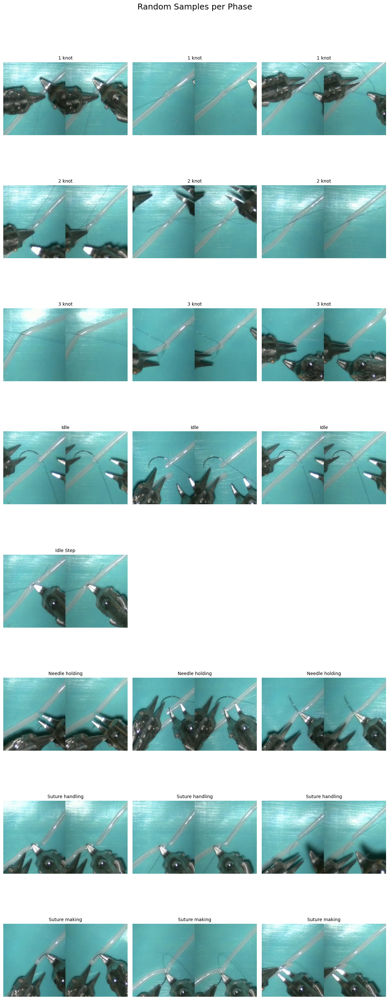

In [9]:
import random
import matplotlib.pyplot as plt
from PIL import Image
from collections import defaultdict

# CONFIGURATION

# Number of sample images to display per phase (i.e., class/label)
samples_per_phase = 3

# Create a dictionary to group image paths by their label (phase ID)
# defaultdict(list) automatically creates an empty list for new keys
label_to_paths = defaultdict(list)

# all_data is assumed to be a list of (frame_path, label_id) pairs
# Here we organize all frame paths under their respective label IDs
for path, label_id in all_data:
    label_to_paths[label_id].append(path)

# Determine the number of unique phases (rows in the final plot)
n_rows = len(label_to_paths)

# Number of columns equals the number of samples we want to show per phase
n_cols = samples_per_phase

# Create a grid of subplots (n_rows x n_cols)
# figsize sets the overall size of the figure (in inches)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 4 * n_rows))

# Add a main title above all the subplots
fig.suptitle("Random Samples per Phase", fontsize=18)

# Get all label IDs in sorted order (for consistent row display)
sorted_labels = sorted(label_to_paths.keys())

# Loop over each row (i.e., each unique label/phase)
for row, label_id in enumerate(sorted_labels):
    # Convert label ID back to its readable name using id_to_phase mapping
    label_name = id_to_phase[label_id]

    # Randomly sample a few images from this label
    # Ensure we don't try to sample more images than we actually have
    samples = random.sample(label_to_paths[label_id], min(samples_per_phase, len(label_to_paths[label_id])))

    # For each column (i.e., each sampled image for this label)
    for col in range(samples_per_phase):
        # Access the correct subplot (row x col)
        # If there's only one row, axes may be 1D
        ax = axes[row, col] if n_rows > 1 else axes[col]

        # Only plot if we have enough samples for this column
        if col < len(samples):
            # Open the image file using PIL
            img = Image.open(samples[col])

            # Display the image in the subplot
            ax.imshow(img)

            # Set the subplot title to the phase name
            ax.set_title(f"{label_name}", fontsize=10)

        # Remove axis ticks and labels for a cleaner look
        ax.axis('off')

# Adjust layout to prevent overlaps
plt.tight_layout()

# Adjust top spacing to make room for the main title
plt.subplots_adjust(top=0.95)

# Display the final grid of images
plt.show()

### 📁 Converting to COCO-style Format
This section creates a new structure suitable for COCO-style datasets used in deep learning. It includes:
```
MISAW_coco/
  ├── Frames/
  │     └── video1_frame_0000.jpg
  ├── annotations.json
  └── phase_to_id.json
```
This format is helpful for multi-label or object detection tasks.

In [10]:
# --- CONFIGURATION ---

# Folder where annotation .txt files are stored
annotation_folder = 'MISAW/train/Procedural decription'

# Folder where frames are stored (e.g., MISAW/train/Frames/1_1/frame_0000.jpg)
frames_folder = 'MISAW/train/Frames'

# Output root folder for the new COCO-style dataset
output_root = 'MISAW_coco'

# Inside this, all frames will be copied to one flat "Frames" folder
frames_out_root = os.path.join(output_root, 'Frames')
os.makedirs(frames_out_root, exist_ok=True)  # Create the folder if it doesn't exist

# --- STEP 1: COLLECT UNIQUE PHASES FROM ALL ANNOTATIONS ---

# Set to store all phase names (e.g., Idle, Suturing, etc.)
all_phases = set()

# Loop through each annotation file and collect phase names
for anno_file in glob.glob(f'{annotation_folder}/*_annotation.txt'):
    df = pd.read_csv(anno_file, sep='\t')  # Load tab-separated .txt file as a DataFrame
    all_phases.update(df['Step'].unique())  # Add unique phases to the set

# Create dictionaries to map phases to integer IDs and back
phase_to_id = {p: i for i, p in enumerate(sorted(all_phases))}  # e.g., "Suturing" → 2
id_to_phase = {i: p for p, i in phase_to_id.items()}            # e.g., 2 → "Suturing"

# --- STEP 2: BUILD JSON ENTRIES AND COPY FRAMES ---

entries = []  # This will hold all annotation entries

# Process each video annotation
for anno_file in glob.glob(f'{annotation_folder}/*_annotation.txt'):
    video_id = os.path.basename(anno_file).replace('_annotation.txt', '')  # e.g., "1_1"

    # Read annotation file
    df = pd.read_csv(anno_file, sep='\t')

    # Resample phase labels to match saved frames (e.g., take every 120th label)
    phases = df['Step'].tolist()[::resample_rate]

    # Get list of resampled frame image paths
    frame_dir = os.path.join(frames_folder, video_id)
    frame_paths = sorted(glob.glob(os.path.join(frame_dir, '*.jpg')))

    # Ensure the number of frames and labels match
    if len(phases) != len(frame_paths):
        print(f"⚠️ Skipping {video_id}: mismatched {len(phases)} labels vs {len(frame_paths)} frames")
        continue

    # Loop over each frame-label pair
    for i, (frame_path, phase) in enumerate(zip(frame_paths, phases)):
        # Create a new frame name (e.g., "1_1_frame_0003.jpg")
        new_frame_name = f"{video_id}_frame_{i:04d}.jpg"

        # Full destination path for the copied frame
        new_frame_path = os.path.join(frames_out_root, new_frame_name)

        # Copy frame to the output folder
        shutil.copy(frame_path, new_frame_path)

        # Add a dictionary entry for this frame in COCO-style format
        entries.append({
            "video": video_id,
            "frame": new_frame_name,
            "path": new_frame_path,
            "label": phase,
            "label_id": phase_to_id[phase]
        })

# --- STEP 3: SAVE TO DISK ---

# Save all frame annotations to a JSON file
with open(os.path.join(output_root, 'annotations.json'), 'w') as f:
    json.dump(entries, f, indent=2)

# Save the phase-to-ID mapping for future use
with open(os.path.join(output_root, 'phase_to_id.json'), 'w') as f:
    json.dump(phase_to_id, f, indent=2)

# Final confirmation
print(f"✅ COCO-style structure created in {output_root}/ with {len(entries)} annotated frames.")

✅ COCO-style structure created in MISAW_coco/ with 21391 annotated frames.


## Training

In [11]:
from torch.utils.data import Dataset
from PIL import Image
import torch

class MISAWDataset(Dataset):
    def __init__(self, annotations, sequence_length=5, transform=None):
        self.annotations = annotations
        self.sequence_length = sequence_length
        self.transform = transform

        # Ensure only complete sequences
        self.num_sequences = len(self.annotations) // self.sequence_length

    def __len__(self):
        return self.num_sequences

    def __getitem__(self, idx):
        # Calculate the start and end index for this sequence
        sequence_start = idx * self.sequence_length
        sequence_end = sequence_start + self.sequence_length

        # Collect the sequence of images
        images = []
        for i in range(sequence_start, sequence_end):
            item = self.annotations[i]
            image = Image.open(item['path']).convert('L')  # Convert to grayscale
            if self.transform:
                image = self.transform(image)
            images.append(image)

        # Stack the images along the sequence dimension
        images = torch.stack(images)  # Shape: (sequence_length, C, H, W)

        # Use the label of the last frame in the sequence as the target
        label = self.annotations[sequence_end - 1]['label_id']

        return images, label

In [12]:
import json
import torch
from torch.utils.data import DataLoader
from torchvision import transforms
from collections import defaultdict

# Load annotations from JSON
with open('MISAW_coco/annotations.json') as f:
    annotations = json.load(f)

# Create a list of video groups
video_groups = defaultdict(list)
for image_info in annotations:
    video_name = image_info["video"]
    video_groups[video_name].append(image_info)

# Split videos deterministically (80% train, 20% val)
all_videos = sorted(video_groups.keys())
split_idx = int(len(all_videos) * 0.8)
train_videos = all_videos[:split_idx]
val_videos = all_videos[split_idx:]

# Collect dataset annotations
train_annotations = [item for vid in train_videos for item in video_groups[vid]]
val_annotations = [item for vid in val_videos for item in video_groups[vid]]

print(f"Train videos: {len(train_videos)}, Val videos: {len(val_videos)}")
print(f"Train frames: {len(train_annotations)}, Val frames: {len(val_annotations)}")

Train videos: 13, Val videos: 4
Train frames: 17847, Val frames: 3544


In [13]:
# Image transformations
transform = transforms.Compose([
    transforms.Grayscale(),                         # Ensures image is 1-channel
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))           # Adjust if using RGB → (0.5, 0.5, 0.5)
])

# Create the train and validation datasets
SEQUENCE_LENGTH = 5
train_dataset = MISAWDataset(train_annotations, sequence_length=SEQUENCE_LENGTH, transform=transform)
val_dataset = MISAWDataset(val_annotations, sequence_length=SEQUENCE_LENGTH, transform=transform)

print(f"Train sequences: {len(train_dataset)}, Val sequences: {len(val_dataset)}")

Train sequences: 3569, Val sequences: 708


In [14]:
from torch.utils.data import DataLoader

BATCH_SIZE = 8
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

# Quick sanity check
for images, labels in train_loader:
    print(f"Images shape: {images.shape}, Labels shape: {labels.shape}")
    break

Images shape: torch.Size([8, 5, 1, 128, 128]), Labels shape: torch.Size([8])


IndexError: index 3 is out of bounds for axis 0 with size 3

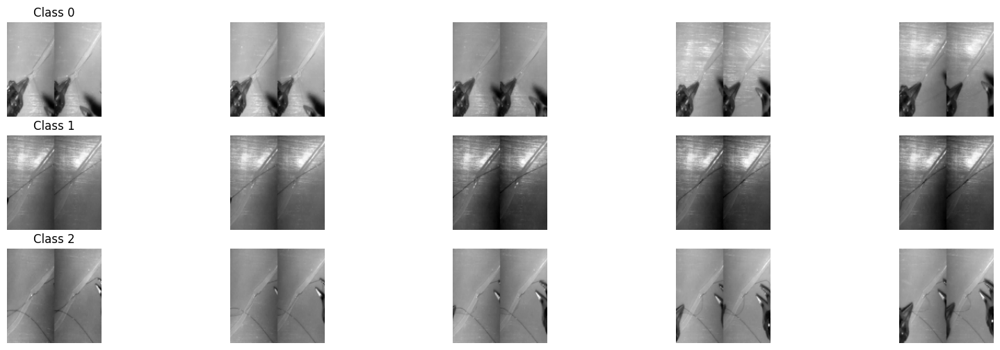

In [16]:
import matplotlib.pyplot as plt
import torch

# 🔍 Visualize examples of each digit from the training dataset
classes = list(range(8))
samples_per_class = {c: None for c in classes}

# Extract one full sequence for each class from the training set
for images, label in train_dataset:
    # Convert the label to an integer if it is a tensor
    if isinstance(label, torch.Tensor):
        label = label.item()

    # Use the label as a scalar, not a tensor
    if samples_per_class[label] is None:
        samples_per_class[label] = images  # Shape: (sequence_length, 1, H, W)
    if all(v is not None for v in samples_per_class.values()):
        break

# Plot the sequences
fig, axes = plt.subplots(3, SEQUENCE_LENGTH, figsize=(20, 6))  # 3 classes, sequence_length frames each
for class_id in classes:
    sequence = samples_per_class[class_id]  # Shape: (sequence_length, 1, H, W)
    for frame_idx in range(sequence.shape[0]):
        ax = axes[class_id, frame_idx]
        # Remove the channel dimension for grayscale images
        ax.imshow(sequence[frame_idx].squeeze(0).cpu().numpy(), cmap="gray")
        ax.axis("off")
        if frame_idx == 0:
            ax.set_title(f"Class {class_id}")

plt.show()


In [21]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchmetrics
from pytorch_lightning import LightningModule
from torchvision.models import resnet50, ResNet50_Weights
from pytorch_tcn import TCN

class LitResNet50TCN(LightningModule):
    def __init__(self, num_classes=8, sequence_length=5, tcn_channels=[256, 256, 256], kernel_size=4, dropout=0.2, lr=1e-3, pooling="mean"):
        super().__init__()
        self.save_hyperparameters()

        # Load pretrained ResNet-50
        weights = ResNet50_Weights.DEFAULT
        self.model = resnet50(weights=weights)

        # Modify input layer to accept 1-channel (grayscale) input
        self.model.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)

        # Extract feature dimension before FC
        self.feature_dim = self.model.fc.in_features

        # Replace final FC layer
        self.model.fc = nn.Identity()

        # TCN module
        self.tcn = TCN(
            num_inputs=self.feature_dim,
            num_channels=tcn_channels,
            kernel_size=kernel_size,
            dropout=dropout,
            input_shape='NCL',
            output_projection=num_classes,
            output_activation=None  # Use CrossEntropyLoss
        )

        # Accuracy metric
        self.accuracy = torchmetrics.Accuracy(task="multiclass", num_classes=num_classes)

        # Learning rate
        self.lr = lr

        # Pooling method
        self.pooling = pooling

    def forward(self, x):
        # Reshape to (B * T, C, H, W) for ResNet
        B, T, C, H, W = x.shape
        x = x.view(B * T, C, H, W)

        # Extract features with ResNet-50
        features = self.model(x)  # Shape: (B * T, feature_dim)

        # Reshape back to (B, T, feature_dim)
        features = features.view(B, T, -1).permute(0, 2, 1)  # Shape: (B, feature_dim, T)

        # Pass through TCN
        logits = self.tcn(features)  # Shape: (B, num_classes, T)

        # Apply temporal pooling
        if self.pooling == "mean":
            logits = logits.mean(dim=-1)  # Shape: (B, num_classes)
        elif self.pooling == "max":
            logits, _ = logits.max(dim=-1)  # Shape: (B, num_classes)
        else:
            raise ValueError(f"Invalid pooling method: {self.pooling}")

        return logits

    def configure_optimizers(self):
        return optim.Adam(self.parameters(), lr=self.lr)

    def step(self, batch, stage="train"):
        x, y = batch
        y_hat = self(x)
        loss = nn.CrossEntropyLoss()(y_hat, y)
        acc = self.accuracy(y_hat, y)
        self.log(f"{stage}_loss", loss, on_step=False, on_epoch=True)
        self.log(f"{stage}_acc", acc, on_step=False, on_epoch=True)
        return loss

    def training_step(self, batch, batch_idx):
        return self.step(batch, stage="train")

    def validation_step(self, batch, batch_idx):
        return self.step(batch, stage="val")

    def test_step(self, batch, batch_idx):
        return self.step(batch, stage="test")


In [22]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchmetrics
from pytorch_lightning import LightningModule
from torchvision.models import resnet50, ResNet50_Weights

class LitResNet50LSTM(LightningModule):
    def __init__(self, num_classes=8, sequence_length=5, lstm_hidden_size=512, lstm_layers=2, dropout=0.2, lr=1e-3, pooling="mean"):
        super().__init__()
        self.save_hyperparameters()

        # Load pretrained ResNet-50
        weights = ResNet50_Weights.DEFAULT
        self.model = resnet50(weights=weights)

        # Modify input layer to accept 1-channel (grayscale) input
        self.model.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)

        # Extract feature dimension before FC
        self.feature_dim = self.model.fc.in_features

        # Replace final FC layer
        self.model.fc = nn.Identity()

        # LSTM module
        self.lstm = nn.LSTM(
            input_size=self.feature_dim,
            hidden_size=lstm_hidden_size,
            num_layers=lstm_layers,
            batch_first=True,
            dropout=dropout,
            bidirectional=False  # Set to True for bidirectional LSTM if needed
        )

        # Final fully connected layer
        self.fc = nn.Linear(lstm_hidden_size, num_classes)

        # Accuracy metric
        self.accuracy = torchmetrics.Accuracy(task="multiclass", num_classes=num_classes)

        # Learning rate
        self.lr = lr

        # Pooling method
        self.pooling = pooling

    def forward(self, x):
        # Reshape to (B * T, C, H, W) for ResNet
        B, T, C, H, W = x.shape
        x = x.view(B * T, C, H, W)

        # Extract features with ResNet-50
        features = self.model(x)  # Shape: (B * T, feature_dim)

        # Reshape back to (B, T, feature_dim)
        features = features.view(B, T, -1)  # Shape: (B, T, feature_dim)

        # Pass through LSTM
        lstm_out, (h_n, c_n) = self.lstm(features)  # Shape: (B, T, lstm_hidden_size)

        # Apply temporal pooling
        if self.pooling == "mean":
            logits = lstm_out.mean(dim=1)  # Shape: (B, lstm_hidden_size)
        elif self.pooling == "max":
            logits, _ = lstm_out.max(dim=1)  # Shape: (B, lstm_hidden_size)
        else:
            raise ValueError(f"Invalid pooling method: {self.pooling}")

        # Final classification layer
        logits = self.fc(logits)  # Shape: (B, num_classes)

        return logits

    def configure_optimizers(self):
        return optim.Adam(self.parameters(), lr=self.lr)

    def step(self, batch, stage="train"):
        x, y = batch
        y_hat = self(x)
        loss = nn.CrossEntropyLoss()(y_hat, y)
        acc = self.accuracy(y_hat, y)
        self.log(f"{stage}_loss", loss, on_step=False, on_epoch=True)
        self.log(f"{stage}_acc", acc, on_step=False, on_epoch=True)
        return loss

    def training_step(self, batch, batch_idx):
        return self.step(batch, stage="train")

    def validation_step(self, batch, batch_idx):
        return self.step(batch, stage="val")

    def test_step(self, batch, batch_idx):
        return self.step(batch, stage="test")


In [23]:
#create directory tb_logs
!mkdir -p tb_logs/

%load_ext tensorboard
%tensorboard --logdir tb_logs/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
from pytorch_lightning import Trainer
from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint

# 🚂 Training Configuration
MODEL_NAME = "LitResNet50TCN"  # Change to LitResNet50LSTM if needed
EPOCHS = 50
CHECKPOINT_DIR = "checkpoints/"
LOG_DIR = "tb_logs"

# Select the model
model = LitResNet50TCN(sequence_length=5)  # or LitResNet50LSTM(sequence_length=8)

# Initialize TensorBoard Logger
logger = TensorBoardLogger(LOG_DIR, name=MODEL_NAME)

# Initialize EarlyStopping and ModelCheckpoint callbacks
early_stop_callback = EarlyStopping(
    monitor="val_loss",
    patience=10,
    mode="min",
    verbose=True
)

checkpoint_callback = ModelCheckpoint(
    monitor="val_loss",
    mode="min",
    save_top_k=1,
    verbose=True,
    dirpath=CHECKPOINT_DIR,
    filename=MODEL_NAME + "-{epoch:02d}-{val_loss:.4f}"
)

# Initialize the Trainer
trainer = Trainer(
    max_epochs=EPOCHS,
    accelerator="auto",
    devices="auto",
    log_every_n_steps=1,  # ✅ log at every step
    logger=logger,  # Log to TensorBoard
    callbacks=[early_stop_callback, checkpoint_callback]
)

# 🚂 Start Training
trainer.fit(model, train_loader, val_loader)


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name     | Type               | Params | Mode 
--------------------------------------------------------
0 | model    | ResNet             | 23.5 M | train
1 | tcn      | TCN                | 3.9 M  | train
2 | accuracy | MulticlassAccuracy | 0      | train
--------------------------------------------------------
27.4 M    Trainable params
0         Non-trainable params
27.4 M    Total params
109.757   Total estimated model params size (MB)
210       Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 2.595
INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 447: 'val_loss' reached 2.59530 (best 2.59530), saving model to '/content/checkpoints/LitResNet50TCN-epoch=00-val_loss=2.5953.ckpt' as top 1


In [ ]:
from pytorch_lightning import Trainer
from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint

# 🚂 Training
model = LitResNet50LSTM(
    num_classes=8,
    sequence_length=5,
    lstm_hidden_size=512,
    lstm_layers=2,
    dropout=0.2,
    lr=1e-3,
    pooling="mean"  # or "max"
)

# Initialize TensorBoardLogger
logger = TensorBoardLogger("tb_logs", name="LitResNet50LSTM")

# Initialize EarlyStopping and ModelCheckpoint callbacks
early_stop_callback = EarlyStopping(
    monitor="val_loss",
    patience=20,
    mode="min",
    verbose=True
)

checkpoint_callback = ModelCheckpoint(
    monitor="val_loss",
    mode="min",
    save_top_k=1,
    verbose=True,
    dirpath="checkpoints/",
    filename="LitResNet50LSTM-{epoch:02d}-{val_loss:.4f}"
)

# Initialize Trainer
trainer = Trainer(
    max_epochs=EPOCHS,
    accelerator="auto",
    devices="auto",
    log_every_n_steps=1,  # ✅ log at every step
    logger=logger,  # Log to TensorBoard
    callbacks=[early_stop_callback, checkpoint_callback]  # Add callbacks here
)

# Start Training
trainer.fit(model, train_loader, val_loader)


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.11/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /content/checkpoints exists and is not empty.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name     | Type               | Params | Mode 
--------------------------------------------------------
0 | model    | ResNet             | 23.5 M | train
1 | lstm     | LSTM               | 7.3 M  | train
2 | fc       | Linear             | 1.5 K  | train
3 | accuracy | MulticlassAccuracy | 0      | train
--------------------------------------------------------
30.9 M    Trainable params
0         Non-trainable params
30.9 M    Total params
123.406   Tota

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 0.922
INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 112: 'val_loss' reached 0.92174 (best 0.92174), saving model to '/content/checkpoints/LitResNet50LSTM-epoch=00-val_loss=0.9217.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 1, global step 224: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.094 >= min_delta = 0.0. New best score: 0.828
INFO:pytorch_lightning.utilities.rank_zero:Epoch 2, global step 336: 'val_loss' reached 0.82777 (best 0.82777), saving model to '/content/checkpoints/LitResNet50LSTM-epoch=02-val_loss=0.8278.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 3, global step 448: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 4, global step 560: 'val_loss' was not in top 1
